#**DCGAN for images**

In this notebook we will cover the DCGANs. In order to keep things simple we will be using the MNIST fashion dataset since images are easy to process and analize at the end.

# ***Import the necessary libraries***

In [1]:
import torch
from torch import nn
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.optim as optim

import math
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import numpy as np

import matplotlib.animation as animation
from IPython.display import HTML

import cv2

# ***Define the different variables***

We define the following variables depending on how we want the model to be trained. First we fix the seed for reproducible results. Note that if any value except the seed is changed then more changes will have to be done in the code that follows. And also highlight that the number of channels since it is black and white pictures the value must be 1 but in case of using color images it should be changed to 3.

In [2]:
torch.manual_seed(0)

In [3]:

# Batch size for the model
batch_size = 256

# Size of the images used, if the image does not meet the size it will be
# rescaled
image_size = 64

# Number of channels in the training images. For black-white images this is 1
nc = 1

#Latent vector size
latentv = 100

# Number of training epochs
epochs = 50

# Learning rate
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# ***Create and visualize the data loader***

We first define a number of transformations such as resizing the image, cropping it, convert it to a tensor and normalize it. Once this is set, download the data and transformit following the transform steps. Then we define the enviroment we want to work with and finally plot an 8x8 grid with images.

100%|██████████| 26421880/26421880 [00:02<00:00, 12651533.31it/s]


Extracting ./FashionMNIST/raw/train-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 208437.32it/s]


Extracting ./FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3695436.58it/s]


Extracting ./FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 20142049.43it/s]


Extracting ./FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./FashionMNIST/raw



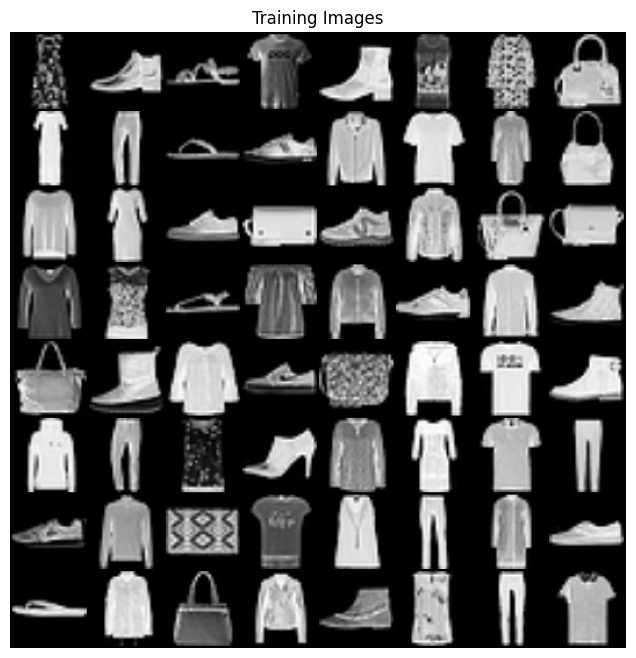

In [4]:
transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5,), (0.5,)),
                           ])

train_set = torchvision.datasets.FashionMNIST(
    root=".", train = True, download=True, transform=transform
)
dataloader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                         shuffle=True)

# Decide which device we want to run on
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
real_batch = next(iter(dataloader))

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

Visualization of the different sizes for a batch in the dataloader, B stands for batch, C for channels, H for height and W for width.

In [5]:
print(real_batch[0][0].shape, 'Size of an image C, H, W')
print(real_batch[0].shape, 'Size of a batch for x:  B, C, H, W')
print(real_batch[1].shape, 'Size of batch for y')

torch.Size([1, 64, 64]) Size of an image C, H, W
torch.Size([256, 1, 64, 64]) Size of a batch for x __ B, C, H, W
torch.Size([256]) Size of batch for y


# ***Weights initialization***

For the weights, they will be initialized following a Normal distribution as it is mentioned in the DCGAN paper.

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# ***Building the model***

Both discriminator and generator follow the same structure, define the class, then send the model to the device we are using and apply the weight's inisialization. Note how next to each conv2d for the discriminator and transposed convolution for the generator there are some numbers. Those numbers are the output size of that convolutional layer following the format of C, H, W. Remember that C stands for channels, H for height and finally W for width. Leaky ReLU is used so the network does not die.

In [7]:
from torch.nn.modules.activation import ReLU
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.modelCNN = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels= 64, kernel_size = 4, padding = 1, stride =2  ), # 64 32 32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=64, out_channels= 128, kernel_size = 4, padding = 1, stride = 2 ), # 128 16 16
            nn.BatchNorm2d(128, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=128, out_channels= 256, kernel_size = 4, padding = 1, stride = 2 ), # 256 8 8
            nn.BatchNorm2d(256, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels= 512, kernel_size = 4, padding = 1, stride = 2 ), # 512 4 4
            nn.BatchNorm2d(512, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels= 1, kernel_size = 4, padding = 0, stride = 1 ), # 512 1 1
            nn.Sigmoid()
        )
    def forward(self, x):

        x = self.modelCNN(x)

        return x

In [8]:
discriminator = Discriminator().to(device="cuda")
discriminator.apply(weights_init)

Discriminator(
  (modelCNN): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
    (12): Sigmoid()
  )
)

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential( # 256 100 1 1
            nn.ConvTranspose2d(in_channels=100, out_channels=256, kernel_size=4, stride=1, padding=0), #512 4 4
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 512, 4, 2, 1), #512 8 8
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, 4, 2, 1), #256 16 16
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 64, 4, 2, 1), # 64 32 32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, 4, 2, 1), # 3 64 64
            nn.Tanh()
        )

    def forward(self, x):
        output = self.model(x)
        return output

generator = Generator().to(device="cuda")
generator.apply(weights_init)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(256, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Tanh()
  )
)

# ***Defining optimizers and training pass***

In [10]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, latentv, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))

In [155]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = discriminator(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latentv, 1, 1, device=device)
        # Generate fake image batch with G
        fake = generator(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = discriminator(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        generator.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/235]	Loss_D: 2.0257	Loss_G: 11.7762	D(x): 0.7631	D(G(z)): 0.7790 / 0.0000
[0/50][50/235]	Loss_D: 0.1488	Loss_G: 4.6447	D(x): 0.9398	D(G(z)): 0.0677 / 0.0160
[0/50][100/235]	Loss_D: 0.1922	Loss_G: 4.3833	D(x): 0.9043	D(G(z)): 0.0648 / 0.0223
[0/50][150/235]	Loss_D: 0.6133	Loss_G: 3.7546	D(x): 0.6548	D(G(z)): 0.0082 / 0.0472
[0/50][200/235]	Loss_D: 0.4154	Loss_G: 2.6891	D(x): 0.7878	D(G(z)): 0.0960 / 0.1176
[1/50][0/235]	Loss_D: 0.6632	Loss_G: 2.5360	D(x): 0.7548	D(G(z)): 0.2389 / 0.1351
[1/50][50/235]	Loss_D: 0.5747	Loss_G: 2.9887	D(x): 0.7671	D(G(z)): 0.2016 / 0.0852
[1/50][100/235]	Loss_D: 0.5571	Loss_G: 2.0837	D(x): 0.7685	D(G(z)): 0.1965 / 0.1718
[1/50][150/235]	Loss_D: 0.5647	Loss_G: 3.1151	D(x): 0.9025	D(G(z)): 0.3275 / 0.0707
[1/50][200/235]	Loss_D: 1.0014	Loss_G: 0.8395	D(x): 0.4986	D(G(z)): 0.1132 / 0.4921
[2/50][0/235]	Loss_D: 1.3325	Loss_G: 3.6375	D(x): 0.9128	D(G(z)): 0.6468 / 0.0416
[2/50][50/235]	Loss_D: 0.8831	Loss_G: 1.8914	D(x): 0.5933

# ***Plotting results and Losses***



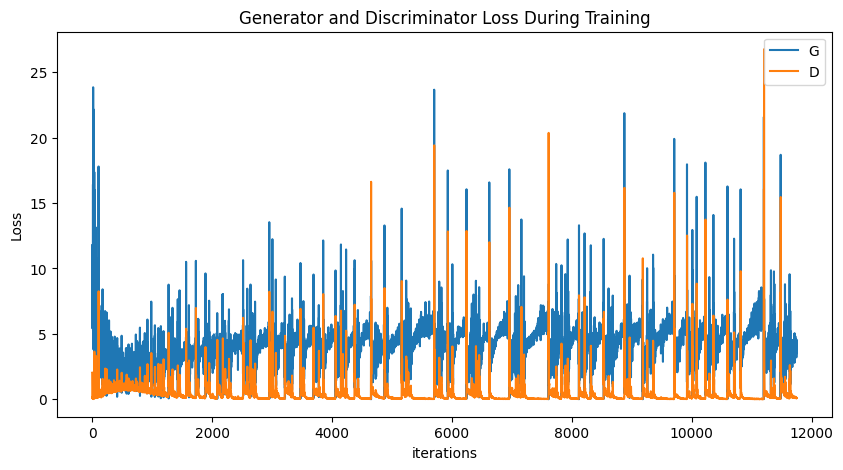

In [156]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

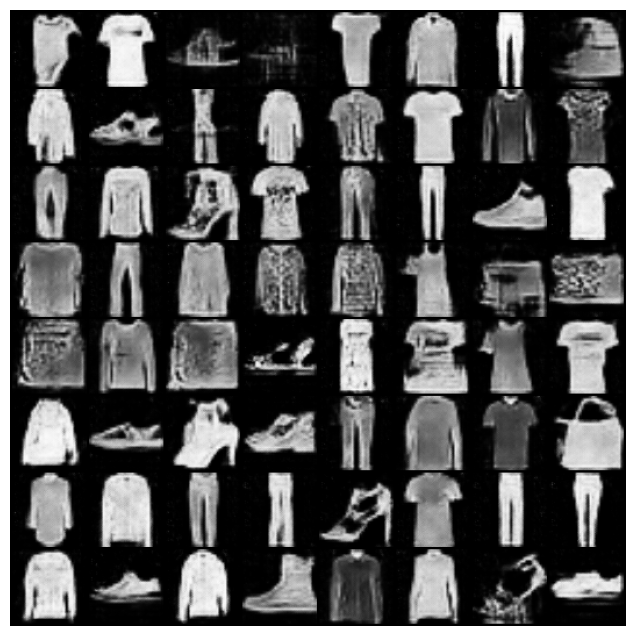

In [157]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())